# Chunking Practical: Most Useful Methods

This notebook covers the following methods:

1. `RecursiveCharacterTextSplitter`
2. `TokenTextSplitter`
3. `CharacterTextSplitter`
4. Fixed-size chunking
5. Content-aware chunking
6. Document structure-based chunking
7. Semantic chunking

## Learning objectives

- Explain chunk size and chunk overlap
- Compare fixed, character, recursive, token, structural, and semantic splitting
- Understand why different strategies produce different boundaries
- Choose a suitable starting method for a given document type
- Evaluate chunks instead of blindly selecting one splitter

1. Fixed-size character chunking
   → CharacterTextSplitter

2. Fixed-size token chunking
   → TokenTextSplitter

3. Recursive structure-aware chunking
   → RecursiveCharacterTextSplitter

4. Document structure-based chunking
   → MarkdownHeaderTextSplitter, HTML splitters, etc.

5. Semantic chunking
   → Embedding-based topic boundaries

CharacterTextSplitter

→ Primarily separator-based

→ Length measured using characters

TokenTextSplitter

→ Directly splits according to tokens

RecursiveCharacterTextSplitter

→ Tries to preserve paragraphs, lines and words

→ Not purely blind fixed-size chunking

In [1]:
from __future__ import annotations
import math
import re
from typing import Any
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from langchain_text_splitters import (
    CharacterTextSplitter,
    MarkdownHeaderTextSplitter,
    RecursiveCharacterTextSplitter,
    TokenTextSplitter,
)

c:\Users\ASUS\Desktop\Gen AI Full stak\env\Lib\site-packages\cupy\_environment.py:284: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(
c:\Users\ASUS\Desktop\Gen AI Full stak\env\Lib\site-packages\cupy\_environment.py:284: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(


# 1. Sample Document

The sample document intentionally contains multiple topics and Markdown headings.  
This makes it useful for comparing basic, structure-aware, and semantic chunking.

In [2]:
document = """
# Artificial Intelligence

Artificial intelligence enables machines to perform tasks that normally require human intelligence.
AI systems can analyze information, identify patterns, and support decision-making.

## Machine Learning

Machine learning is a branch of artificial intelligence.
It enables systems to learn patterns from historical data instead of relying only on explicitly programmed rules.
Supervised learning uses labelled examples, while unsupervised learning discovers patterns in unlabelled data.

## Deep Learning

Deep learning uses neural networks containing multiple layers.
It is commonly applied to image recognition, speech processing, and natural-language applications.

# Employee Leave Policy

Employees receive twenty paid leave days during a calendar year.
Leave requests should be submitted to the reporting manager before the planned absence.
Emergency leave may be submitted later when advance notice is not possible.

## Approval Process

The manager reviews the leave balance, project schedule, and team availability.
Approved leave is recorded in the human-resource management system.

# Information Security

Employees must not share passwords or authentication codes.
Sensitive company information should be stored only in approved systems.
Suspected security incidents must be reported to the security team immediately.
""".strip()

In [3]:
print(document)

# Artificial Intelligence

Artificial intelligence enables machines to perform tasks that normally require human intelligence.
AI systems can analyze information, identify patterns, and support decision-making.

## Machine Learning

Machine learning is a branch of artificial intelligence.
It enables systems to learn patterns from historical data instead of relying only on explicitly programmed rules.
Supervised learning uses labelled examples, while unsupervised learning discovers patterns in unlabelled data.

## Deep Learning

Deep learning uses neural networks containing multiple layers.
It is commonly applied to image recognition, speech processing, and natural-language applications.

# Employee Leave Policy

Employees receive twenty paid leave days during a calendar year.
Leave requests should be submitted to the reporting manager before the planned absence.
Emergency leave may be submitted later when advance notice is not possible.

## Approval Process

The manager reviews the lea

In [5]:
from pypdf import PdfReader
reader = PdfReader(r"C:\Users\ASUS\Desktop\Gen AI Full stak\class_23_chuncking\data\llama2-research-paper.pdf")
page_texts = []

for page_number, page in enumerate(reader.pages, start=1):
    text = page.extract_text() or ""

    if text.strip():
        page_texts.append(text)

    print(
        f"Page {page_number}: "
        f"{len(text)} characters extracted"
    )

Page 1: 1892 characters extracted
Page 2: 2452 characters extracted
Page 3: 3688 characters extracted
Page 4: 2508 characters extracted
Page 5: 2778 characters extracted
Page 6: 2116 characters extracted
Page 7: 3792 characters extracted
Page 8: 3145 characters extracted
Page 9: 4016 characters extracted
Page 10: 4970 characters extracted
Page 11: 4150 characters extracted
Page 12: 3722 characters extracted
Page 13: 3599 characters extracted
Page 14: 2569 characters extracted
Page 15: 4253 characters extracted
Page 16: 3185 characters extracted
Page 17: 4583 characters extracted
Page 18: 3304 characters extracted
Page 19: 2677 characters extracted
Page 20: 4867 characters extracted
Page 21: 2931 characters extracted
Page 22: 3630 characters extracted
Page 23: 3542 characters extracted
Page 24: 4882 characters extracted
Page 25: 2363 characters extracted
Page 26: 3332 characters extracted
Page 27: 4053 characters extracted
Page 28: 3226 characters extracted
Page 29: 4444 characters extr

In [6]:
document = "\n\n".join(page_texts)

In [4]:
print(document)

Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev
Punit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich
Yinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra
Igor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi
Alan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqing Ellen Tan Binh Tang
Ross Taylor Adina Williams Jian Xiang Kuan Puxin Xu Zheng Yan Iliyan Zarov Yuchen Zhang
Angela Fan Melanie Kambadur Sharan Narang Aurelien Rodriguez Robert Stojnic
Sergey Edunov

# 2. Helper Functions

These helpers print chunks consistently and collect simple statistics.

In [7]:
from typing import Any

def print_chunks(
    title: str,
    chunks: list[Any],
    preview_limit: int = 500,
) -> None:
    print(f"\n{'=' * 90}")
    print(title)
    print(f"Total chunks: {len(chunks)}")
    print("=" * 90)

    for index, chunk in enumerate(chunks, start=1):

        # Get text from a LangChain Document or normal Python object
        text = getattr(
            chunk,
            "page_content",
            str(chunk),
        )

        # Get metadata if available
        metadata = getattr(
            chunk,
            "metadata",
            {},
        )

        print(
            f"\nChunk {index} | "
            f"characters={len(text)}"
        )

        if metadata:
            print("Metadata:", metadata)

        if len(text) > preview_limit:
            print(text[:preview_limit] + "...")
        else:
            print(text)

In [8]:
from typing import Any
import numpy as np


def chunk_stats(
    method: str,
    chunks: list[Any],
) -> dict[str, Any]:

    lengths = [
        len(
            getattr(
                chunk,
                "page_content",
                str(chunk),
            )
        )
        for chunk in chunks
    ]

    return {
        "method": method,
        "number_of_chunks": len(chunks),
        "minimum_length": min(lengths) if lengths else 0,
        "maximum_length": max(lengths) if lengths else 0,
        "average_length": (
            round(float(np.mean(lengths)), 2)
            if lengths
            else 0
        ),
        "total_stored_characters": sum(lengths),
    }

In [9]:
RecursiveCharacterTextSplitter()

In [11]:
all_results: dict[str, list[Any]] = {}

# 3. Fixed-Size Chunking

Fixed-size chunking divides content after a specified number of characters or tokens.

It is simple and predictable, but it may break:

- Words
- Sentences
- Paragraphs
- Logical topics

In [12]:
def fixed_size_chunking(text: str, chunk_size: int, chunk_overlap: int = 0) -> list[str]:
    if chunk_size <= 0:
        raise ValueError("chunk_size must be greater than zero.")

    if chunk_overlap < 0 or chunk_overlap >= chunk_size:
        raise ValueError(
            "chunk_overlap must satisfy 0 <= chunk_overlap < chunk_size."
        )

    step = chunk_size - chunk_overlap

    return [
        text[start:start + chunk_size]
        for start in range(0, len(text), step)
    ]

In [13]:
text = "ABCDEFGHIJKLMNOPQRSTUVWXYZ"

In [14]:
len(text)

26

In [15]:
fixed_size_chunking(
    text=text,
    chunk_size=10,
    chunk_overlap=2,
)

['ABCDEFGHIJ', 'IJKLMNOPQR', 'QRSTUVWXYZ', 'YZ']

10 - 2 = 8

So chunks begin at positions 0, 8, 16, 24.

In [16]:
document

'Llama 2: Open Foundation and Fine-Tuned Chat Models\nHugo Touvron∗ Louis Martin† Kevin Stone†\nPeter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra\nPrajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen\nGuillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller\nCynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou\nHakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev\nPunit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich\nYinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra\nIgor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi\nAlan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqing Ellen Tan Binh Tang\nRoss Taylor Adina Williams Jian Xiang Kuan Puxin Xu Zheng Yan Iliyan Zarov Yuchen Zhang\nAngela Fan Melanie Kambadur Sharan Narang Aurelien Rodriguez Robert Stojnic\

In [17]:
fixed_chunks = fixed_size_chunking(
    text=document,
    chunk_size=300,
    chunk_overlap=50,
)

In [18]:
fixed_chunks

['Llama 2: Open Foundation and Fine-Tuned Chat Models\nHugo Touvron∗ Louis Martin† Kevin Stone†\nPeter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra\nPrajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen\nGuillem Cucurull David Esiobu Jude Fernand',
 'ya Chen\nGuillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller\nCynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou\nHakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev\nPunit Singh Koura Marie-Anne Lachaux Thibaut Lavr',
 '\nPunit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich\nYinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra\nIgor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi\nAlan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqi',
 'Silva Eric Michael Smith Ranjan Subramanian Xiaoqing Ellen Tan Binh Tan

In [19]:
len(fixed_chunks)

1043

In [20]:
all_results["Manual fixed-size"] = fixed_chunks

In [21]:
all_results

{'Manual fixed-size': ['Llama 2: Open Foundation and Fine-Tuned Chat Models\nHugo Touvron∗ Louis Martin† Kevin Stone†\nPeter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra\nPrajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen\nGuillem Cucurull David Esiobu Jude Fernand',
  'ya Chen\nGuillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller\nCynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou\nHakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev\nPunit Singh Koura Marie-Anne Lachaux Thibaut Lavr',
  '\nPunit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich\nYinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra\nIgor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi\nAlan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqi',
  'Silva Eric Michael Smith Ranjan Subramanian Xi

In [22]:
print_chunks("Manual Fixed-Size Chunking", fixed_chunks)


Manual Fixed-Size Chunking
Total chunks: 1043

Chunk 1 | characters=300
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernand

Chunk 2 | characters=300
ya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev
Punit Singh Koura Marie-Anne Lachaux Thibaut Lavr

Chunk 3 | characters=300

Punit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich
Yinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra
Igor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi
Alan Schelten Ruan Silva Eric Michael Smit

## What to observe

- Every chunk targets the same maximum character size.
- Fifty characters are repeated between neighbouring chunks.
- A boundary may occur in the middle of a sentence or heading.
- Overlap protects some boundary information but also creates duplication.

# 4. `CharacterTextSplitter`

`CharacterTextSplitter` splits using one selected separator.

In this example, the separator is a blank line (`"\n\n"`), so it tries to keep paragraphs together.

This is easy to understand, but one separator may not be sufficient for every document.

In [23]:
from langchain_text_splitters import (
    CharacterTextSplitter,
    RecursiveCharacterTextSplitter
)

In [24]:
character_splitter = CharacterTextSplitter(
    separator="\n\n",
    chunk_size=300,
    chunk_overlap=50,
    length_function=len,
)

In [25]:
character_splitter = CharacterTextSplitter(
    chunk_size=300,
    chunk_overlap=50,
    length_function=len,
)

In [26]:
character_splitter = CharacterTextSplitter(
    separator="\n",
    chunk_size=300,
    chunk_overlap=50,
    length_function=len,
)

In [28]:
character_chunks = character_splitter.split_text(document)

Created a chunk of size 371, which is longer than the specified 300
Created a chunk of size 371, which is longer than the specified 300
Created a chunk of size 310, which is longer than the specified 300
Created a chunk of size 371, which is longer than the specified 300


In [29]:
all_results["CharacterTextSplitter"] = character_chunks

In [30]:
print_chunks("CharacterTextSplitter", character_chunks)


CharacterTextSplitter
Total chunks: 1078

Chunk 1 | characters=257
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen

Chunk 2 | characters=242
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev

Chunk 3 | characters=229
Punit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich
Yinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra
Igor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi

Chunk 4 | characters=297
Alan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqing Ellen Tan Binh Tang
Ross Taylor Adina Williams Jian

## Important observation

`CharacterTextSplitter` is separator-driven. If an individual separator-delimited block is already larger than the target size, the output may not behave like strict fixed-width slicing.

Use it when the source has a predictable separator and you want a simple baseline.

# 5. `RecursiveCharacterTextSplitter`

This splitter tries separators recursively.

Typical order:

```text
Paragraph → line → sentence-like boundary → word → character
```

It first tries to preserve large natural units. If a unit is too large, it moves to a finer separator.

In [31]:
recursive_splitter = RecursiveCharacterTextSplitter(
    separators=["\n\n", "\n", ". ", " ", ""],
    chunk_size=300,
    chunk_overlap=50,
    length_function=len,
    add_start_index=True,
)

In [32]:
recursive_splitter = RecursiveCharacterTextSplitter(
    separators=["\n\n", "\n", ". ", " ", ""],
    chunk_size=5,
    chunk_overlap=2,
    length_function=len,
    add_start_index=True,
)

In [33]:
text = """Artificial Intelligence

AI enables machines to perform intelligent tasks.
Machine learning is a part of AI.

Employee Leave Policy

Employees receive 20 paid leave days.
Leave must be approved by the manager.
"""

recursive_splitter.create_documents(
    texts=[text],
    metadatas=[{"source": "classroom_sample.md"}],
)

[Document(metadata={'source': 'classroom_sample.md', 'start_index': 0}, page_content='Artif'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 3}, page_content='ifici'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 6}, page_content='cial'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 11}, page_content='Inte'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 13}, page_content='telli'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 16}, page_content='ligen'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 19}, page_content='ence'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 25}, page_content='AI'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 28}, page_content='enab'),
 Document(metadata={'source': 'classroom_sample.md', 'start_index': 30}, page_content='ables'),
 Document(metadata={'source': 'classroom_sample.md

In [34]:
recursive_documents = recursive_splitter.create_documents(
    texts=[document],
    metadatas=[{"source": "classroom_sample.md"}],
)

In [35]:
all_results["RecursiveCharacterTextSplitter"] = recursive_documents

In [36]:
print_chunks(
    "RecursiveCharacterTextSplitter",
    recursive_documents,
)


RecursiveCharacterTextSplitter
Total chunks: 75965

Chunk 1 | characters=5
Metadata: {'source': 'classroom_sample.md', 'start_index': 0}
Llama

Chunk 2 | characters=2
Metadata: {'source': 'classroom_sample.md', 'start_index': 6}
2:

Chunk 3 | characters=4
Metadata: {'source': 'classroom_sample.md', 'start_index': 9}
Open

Chunk 4 | characters=4
Metadata: {'source': 'classroom_sample.md', 'start_index': 14}
Foun

Chunk 5 | characters=5
Metadata: {'source': 'classroom_sample.md', 'start_index': 16}
undat

Chunk 6 | characters=5
Metadata: {'source': 'classroom_sample.md', 'start_index': 19}
ation

Chunk 7 | characters=3
Metadata: {'source': 'classroom_sample.md', 'start_index': 25}
and

Chunk 8 | characters=4
Metadata: {'source': 'classroom_sample.md', 'start_index': 29}
Fine

Chunk 9 | characters=5
Metadata: {'source': 'classroom_sample.md', 'start_index': 31}
ne-Tu

Chunk 10 | characters=5
Metadata: {'source': 'classroom_sample.md', 'start_index': 34}
Tuned

Chunk 11 | characters=4
Met

## Why it is commonly used

- It works well for general text
- It tries to preserve natural boundaries
- It still controls chunk size
- It is a strong baseline for PDFs, reports, policies, and articles

# 6. `TokenTextSplitter`

LLMs and embedding models process tokens rather than raw characters.

Token-based chunking is useful when:

- The embedding model has a strict token limit
- You need predictable model-input sizing
- Character counts do not accurately represent model usage

This example uses the `cl100k_base` tokenizer.

In [42]:
token_splitter = TokenTextSplitter(
    encoding_name="cl100k_base",
    chunk_size=80,
    chunk_overlap=15,
)

In [43]:
token_chunks = token_splitter.split_text(document)

In [44]:
all_results["TokenTextSplitter"] = token_chunks

In [45]:
print_chunks("TokenTextSplitter", token_chunks)


TokenTextSplitter
Total chunks: 1112

Chunk 1 | characters=260
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Gu

Chunk 2 | characters=257
ikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian

Chunk 3 | characters=247
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev
Punit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich
Yinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra
Igor Molybog Yixin

Chunk 4 | characters=273
aylov Pushkar Mishra
Igor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta 

## Character count is not token count

A 300-character chunk is not necessarily a 300-token chunk.

Token count varies with:

- Language
- Punctuation
- Numbers
- Source code
- Model tokenizer

# 7. Content-Aware Chunking

Content-aware chunking respects natural content boundaries such as:

- Paragraphs
- Sentences
- Sections
- Lists

The custom implementation below:

1. Splits the document into paragraphs
2. Keeps a paragraph intact when possible
3. Uses sentence-level splitting when a paragraph is too large
4. Merges units until the target size is reached

This is an educational implementation, not a replacement for every production parser.

In [46]:
def split_sentences(text: str) -> list[str]:
    return [
        sentence.strip()
        for sentence in re.split(r"(?<=[.!?])\s+", text.strip())
        if sentence.strip()
    ]

In [47]:
def content_aware_chunking(
    text: str,
    max_characters: int = 300,
) -> list[str]:
    if max_characters <= 0:
        raise ValueError("max_characters must be greater than zero.")

    paragraphs = [
        paragraph.strip()
        for paragraph in text.split("\\n\\n")
        if paragraph.strip()
    ]

    logical_units: list[str] = []

    for paragraph in paragraphs:
        if len(paragraph) <= max_characters:
            logical_units.append(paragraph)
        else:
            logical_units.extend(split_sentences(paragraph))

    chunks: list[str] = []
    current_units: list[str] = []
    current_length = 0

    for unit in logical_units:
        separator_length = 2 if current_units else 0
        proposed_length = current_length + separator_length + len(unit)

        if current_units and proposed_length > max_characters:
            chunks.append("\\n\\n".join(current_units))
            current_units = [unit]
            current_length = len(unit)
        else:
            current_units.append(unit)
            current_length = proposed_length

    if current_units:
        chunks.append("\\n\\n".join(current_units))

    return chunks

In [48]:
text = """Artificial Intelligence

AI enables machines to perform intelligent tasks.
Machine learning is a part of AI.

Employee Leave Policy

Employees receive 20 paid leave days.
Leave must be approved by the manager.
"""

In [49]:
content_aware_chunking(text = text)

['Artificial Intelligence\n\nAI enables machines to perform intelligent tasks.\nMachine learning is a part of AI.\n\nEmployee Leave Policy\n\nEmployees receive 20 paid leave days.\nLeave must be approved by the manager.']

In [50]:
content_aware_chunks = content_aware_chunking(
    text=document,
    max_characters=300,
)

In [51]:

print_chunks("Content-Aware Chunking", content_aware_chunks)


Content-Aware Chunking
Total chunks: 1041

Chunk 1 | characters=1212
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev...

Chunk 2 | characters=276
Our fine-tuned LLMs, calledLlama 2-Chat, are optimized for dialogue use cases.\n\nOur
models outperform open-source chat models on most benchmarks we tested, and based on
our human evaluations for helpfulness and safety, may be a suitable substitute for closed-
source models.

Chunk 3 | characters=212
We provide a detailed description of our approach to fine-tuning and safety
improvements ofLlama 

In [52]:
all_results["Content-aware"] = content_aware_chunks

## Difference from blind fixed-size splitting

Fixed-size chunking asks:

> Has the size limit been reached?

Content-aware chunking also asks:

> Is this a natural place to create a boundary?

# 8. Document Structure-Based Chunking

Some documents already contain meaningful structure:

- Markdown headings
- HTML heading tags
- JSON hierarchy
- Code functions and classes
- PDF layout elements

For Markdown, `MarkdownHeaderTextSplitter` can use headings to create logical sections and preserve heading context as metadata.

In [53]:
markdown_splitter = MarkdownHeaderTextSplitter(
    headers_to_split_on=[
        ("#", "Header 1"),
        ("##", "Header 2"),
        ("###", "Header 3"),
    ],
    strip_headers=True,
)

header_documents = markdown_splitter.split_text(document)

all_results["Markdown structure"] = header_documents
print_chunks(
    "MarkdownHeaderTextSplitter",
    header_documents,
)


MarkdownHeaderTextSplitter
Total chunks: 1

Chunk 1 | characters=260635
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev...


## Two-stage production pattern

A heading-based section may still be too large.

A practical strategy is:

```text
Stage 1: Split by document structure
Stage 2: Recursively split oversized sections
```

In [54]:
secondary_splitter = RecursiveCharacterTextSplitter(
    chunk_size=250,
    chunk_overlap=40,
    separators=["\n\n", "\n", ". ", " ", ""],
)

structure_then_recursive = secondary_splitter.split_documents(
    header_documents
)

all_results["Structure + recursive"] = structure_then_recursive
print_chunks(
    "Structure-Based Splitting Followed by Recursive Splitting",
    structure_then_recursive,
)


Structure-Based Splitting Followed by Recursive Splitting
Total chunks: 1285

Chunk 1 | characters=167
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra

Chunk 2 | characters=249
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou

Chunk 3 | characters=228
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev
Punit Singh Koura Marie-Anne Lachaux Thibaut Lavril Jenya Lee Diana Liskovich
Yinghai Lu Yuning Mao Xavier Martinet Todor Mihaylov Pushkar Mishra

Chunk 4 | characters=175
Igor Molybog Yixin Nie Andrew Poulton Jeremy Reizenstein Rashi Rungta Kalyan Saladi
Alan Schelten Ruan Silva Eric Michael Smith Ranjan Subramanian Xiaoqing Ellen Tan Binh 

# 9. Semantic Chunking

Semantic chunking creates boundaries when the topic or meaning changes.

High-level process:

```text
Document
   ↓
Split into sentences
   ↓
Create sentence-window embeddings
   ↓
Compare neighbouring windows
   ↓
Large semantic distance = possible topic shift
   ↓
Create a new chunk
```

Unlike fixed-size chunking, semantic chunks do not need to have equal lengths.

Window 1:
Sentence 1 + Sentence 2

Window 2:
Sentence 1 + Sentence 2 + Sentence 3

Window 3:
Sentence 2 + Sentence 3 + Sentence 4

Window 4:
Sentence 3 + Sentence 4

In [55]:
def create_sentence_windows(sentences: list[str], buffer_size: int = 1,) -> list[str]:
    
    windows = []

    for index in range(len(sentences)):
        start = max(0, index - buffer_size)
        end = min(len(sentences), index + buffer_size + 1)
        windows.append(" ".join(sentences[start:end]))

    return windows

In [56]:
def create_local_embeddings(texts: list[str], model_name: str = "sentence-transformers/all-MiniLM-L6-v2",) -> tuple[np.ndarray, str]:
    """
    Prefer a local Sentence Transformers embedding model.

    If the model cannot be loaded, fall back to TF-IDF so that the notebook
    remains runnable. TF-IDF is lexical, not a true semantic replacement.
    """
    try:
        from sentence_transformers import SentenceTransformer

        model = SentenceTransformer(model_name)
        embeddings = model.encode(
            texts,
            normalize_embeddings=True,
            show_progress_bar=False,
        )

        return np.asarray(embeddings), "Sentence Transformers embeddings"

    except Exception as error:
        from sklearn.feature_extraction.text import TfidfVectorizer

        print("Sentence Transformers could not be loaded.")
        print("Using TF-IDF fallback for demonstration only.")
        print("Reason:", repr(error))

        vectorizer = TfidfVectorizer()
        embeddings = vectorizer.fit_transform(texts).toarray()

        norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
        norms[norms == 0] = 1.0
        embeddings = embeddings / norms

        return embeddings, "TF-IDF fallback"

In [57]:
def semantic_chunking(text: str, breakpoint_percentile: float = 75, buffer_size: int = 1,
) -> tuple[list[str], pd.DataFrame, str]:
    sentences = split_sentences(
        re.sub(r"\\n+", " ", text)
    )

    if len(sentences) <= 1:
        return sentences, pd.DataFrame(), "No embedding required"

    windows = create_sentence_windows(
        sentences,
        buffer_size=buffer_size,
    )

    embeddings, embedding_method = create_local_embeddings(windows)

    similarities = np.sum(
        embeddings[:-1] * embeddings[1:],
        axis=1,
    )
    distances = 1 - similarities

    threshold = float(
        np.percentile(
            distances,
            breakpoint_percentile,
        )
    )

    break_after_indices = {
        index
        for index, distance in enumerate(distances)
        if distance > threshold
    }

    chunks: list[str] = []
    current_chunk: list[str] = []

    for index, sentence in enumerate(sentences):
        current_chunk.append(sentence)

        if index in break_after_indices:
            chunks.append(" ".join(current_chunk))
            current_chunk = []

    if current_chunk:
        chunks.append(" ".join(current_chunk))

    analysis = pd.DataFrame(
        {
            "left_sentence": sentences[:-1],
            "right_sentence": sentences[1:],
            "similarity": similarities,
            "distance": distances,
            "is_breakpoint": [
                index in break_after_indices
                for index in range(len(distances))
            ],
        }
    )

    analysis.attrs["threshold"] = threshold
    analysis.attrs["embedding_method"] = embedding_method

    return chunks, analysis, embedding_method

In [58]:
from sentence_transformers import SentenceTransformer

In [59]:
semantic_chunks, semantic_analysis, embedding_method = semantic_chunking(
    text=document,
    breakpoint_percentile=75,
    buffer_size=1,
)

In [60]:
print("Embedding method:", embedding_method)
print(
    "Distance threshold:",
    round(semantic_analysis.attrs.get("threshold", 0), 4),
)

print_chunks("Semantic Chunking", semantic_chunks)
display(semantic_analysis)

Embedding method: Sentence Transformers embeddings
Distance threshold: 0.2625

Semantic Chunking
Total chunks: 709

Chunk 1 | characters=1291
Llama 2: Open Foundation and Fine-Tuned Chat Models
Hugo Touvron∗ Louis Martin† Kevin Stone†
Peter Albert Amjad Almahairi Yasmine Babaei Nikolay Bashlykov Soumya Batra
Prajjwal Bhargava Shruti Bhosale Dan Bikel Lukas Blecher Cristian Canton Ferrer Moya Chen
Guillem Cucurull David Esiobu Jude Fernandes Jeremy Fu Wenyin Fu Brian Fuller
Cynthia Gao Vedanuj Goswami Naman Goyal Anthony Hartshorn Saghar Hosseini Rui Hou
Hakan Inan Marcin Kardas Viktor Kerkez Madian Khabsa Isabel Kloumann Artem Korenev...

Chunk 2 | characters=559
Our
models outperform open-source chat models on most benchmarks we tested, and based on
our human evaluations for helpfulness and safety, may be a suitable substitute for closed-
source models. We provide a detailed description of our approach to fine-tuning and safety
improvements ofLlama 2-Chat in order to enable the commun

,left_sentence,right_sentence,similarity,distance,is_breakpoint
0,Llama 2: Open Foundation and Fine-Tuned Chat M...,"Our fine-tuned LLMs, calledLlama 2-Chat, are o...",1.000000,1.192093e-07,False
1,"Our fine-tuned LLMs, calledLlama 2-Chat, are o...",Our\nmodels outperform open-source chat models...,0.169880,8.301197e-01,True
2,Our\nmodels outperform open-source chat models...,We provide a detailed description of our appro...,0.939410,6.059015e-02,False
3,We provide a detailed description of our appro...,"∗Equal contribution, corresponding authors: {t...",0.780893,2.191066e-01,False
4,"∗Equal contribution, corresponding authors: {t...",arXiv:2307.09288v2 [cs.CL] 19 Jul 2023\n\nCo...,0.410320,5.896795e-01,True
...,...,...,...,...,...
2828,Ethical Considerations and Limitations(Section...,Testing conducted to date has been in\nEnglish...,0.761586,2.384144e-01,False
2829,Testing conducted to date has been in\nEnglish...,"For these reasons, as with all LLMs,\nLlama 2’...",0.810249,1.897514e-01,False
2830,"For these reasons, as with all LLMs,\nLlama 2’...","Therefore, before deploying any\napplications ...",0.905627,9.437335e-02,False
2831,"Therefore, before deploying any\napplications ...",Please see the Responsible Use Guide available...,0.846475,1.535254e-01,False


In [61]:
all_results["Semantic chunking"] = semantic_chunks



## Visualize semantic distances

Higher bars indicate a larger change in meaning between neighbouring sentence windows.

The dashed line is the selected breakpoint threshold.

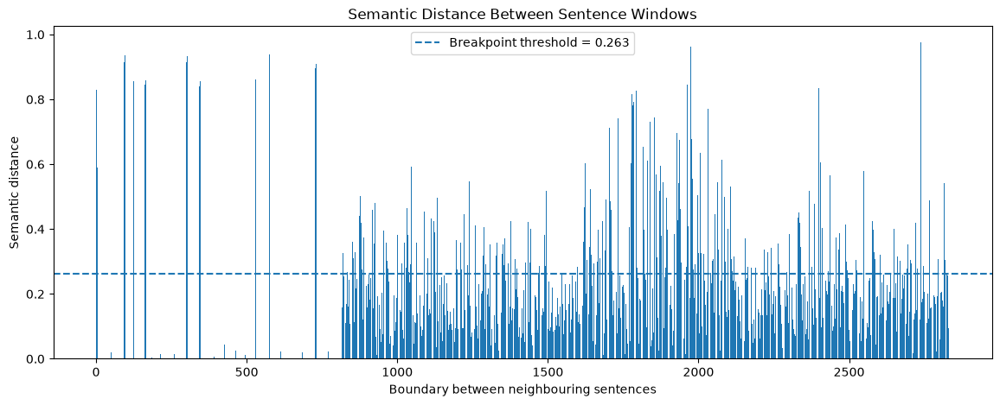

In [62]:
if not semantic_analysis.empty:
    threshold = semantic_analysis.attrs["threshold"]

    plt.figure(figsize=(14, 5))
    plt.bar(
        range(len(semantic_analysis)),
        semantic_analysis["distance"],
    )
    plt.axhline(
        threshold,
        linestyle="--",
        label=f"Breakpoint threshold = {threshold:.3f}",
    )
    plt.xlabel("Boundary between neighbouring sentences")
    plt.ylabel("Semantic distance")
    plt.title("Semantic Distance Between Sentence Windows")
    plt.legend()
    plt.show()

## Threshold experiment

- Lower percentile → more breakpoints → more chunks
- Higher percentile → fewer breakpoints → larger chunks

Run the following experiment and compare the results.

In [63]:
threshold_experiment = []

for percentile in [50, 65, 75, 85, 90]:
    chunks, analysis, method = semantic_chunking(
        text=document,
        breakpoint_percentile=percentile,
        buffer_size=1,
    )

    threshold_experiment.append(
        {
            "percentile": percentile,
            "number_of_chunks": len(chunks),
            "distance_threshold": round(
                analysis.attrs.get("threshold", 0),
                4,
            ),
            "embedding_method": method,
        }
    )

display(pd.DataFrame(threshold_experiment))

,percentile,number_of_chunks,distance_threshold,embedding_method
0,50,1417,0.1384,Sentence Transformers embeddings
1,65,993,0.2068,Sentence Transformers embeddings
2,75,709,0.2625,Sentence Transformers embeddings
3,85,426,0.3488,Sentence Transformers embeddings
4,90,285,0.4154,Sentence Transformers embeddings


# 10. Compare All Methods

This table compares chunk count and size distribution.

It does not prove which method is best. Retrieval evaluation is still required.

In [65]:
comparison = pd.DataFrame(
    [
        chunk_stats(method, chunks)
        for method, chunks in all_results.items()
    ]
).sort_values(
    by="number_of_chunks"
).reset_index(drop=True)

display(comparison)

,method,number_of_chunks,minimum_length,maximum_length,average_length,total_stored_characters
0,Markdown structure,1,260635,260635,260635.00,260635
1,Semantic chunking,709,1,3407,366.58,259902
2,Content-aware,1041,23,2206,254.51,264949
3,Manual fixed-size,1043,119,300,299.83,312719
4,CharacterTextSplitter,1078,7,371,247.96,267305
5,TokenTextSplitter,1112,85,486,288.21,320487
6,Structure + recursive,1285,7,249,206.42,265256
7,RecursiveCharacterTextSplitter,75965,1,5,3.91,297167


# 11. How to Choose a Method

| Requirement | Suggested starting method |
|---|---|
| General PDF, report, or article | `RecursiveCharacterTextSplitter` |
| Strict model token limit | `TokenTextSplitter` |
| Simple predictable separator | `CharacterTextSplitter` |
| Basic baseline experiment | Manual fixed-size chunking |
| Paragraph and sentence preservation | Content-aware chunking |
| Markdown, HTML, JSON, or code | Document structure-based chunking |
| Frequent topic changes without reliable structure | Semantic chunking |

## Practical recommendation

Start with:

```text
RecursiveCharacterTextSplitter
```

Then compare it with a specialized method only when your document structure or retrieval results justify the added complexity.

# 12. Retrieval Evaluation Exercise

A chunking method should be judged using realistic questions.

Suggested evaluation questions for this sample document:

1. How many paid leave days do employees receive?
2. Who should approve a leave request?
3. What is supervised learning?
4. Where should sensitive company information be stored?
5. What should an employee do after noticing a security incident?

For each method, inspect:

- Did the relevant chunk contain the answer?
- Did it include enough surrounding context?
- Did it also include too much unrelated information?
- How much duplicate text was created?
- Would the chunk fit within the embedding-model limit?

# 13. Final Classroom Summary

> Fixed-size chunking is simple but may break meaning. `CharacterTextSplitter` uses one separator. `RecursiveCharacterTextSplitter` tries multiple boundaries and is a strong general-purpose baseline. `TokenTextSplitter` controls model-token limits. Content-aware and structure-based methods preserve natural organization. Semantic chunking uses embeddings to detect changes in meaning, but it adds cost and tuning complexity. The best method is the one that performs best on real retrieval questions.

# Official References

- LangChain text splitter integrations:  
  https://docs.langchain.com/oss/python/integrations/splitters

- Recursive splitting:  
  https://docs.langchain.com/oss/python/integrations/splitters/recursive_text_splitter

- Character splitting:  
  https://docs.langchain.com/oss/python/integrations/splitters/character_text_splitter

- Token splitting:  
  https://docs.langchain.com/oss/python/integrations/splitters/split_by_token

- Markdown structure splitting:  
  https://docs.langchain.com/oss/python/integrations/splitters/markdown_header_metadata_splitter